<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Imports-and-definitions" data-toc-modified-id="Imports-and-definitions-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Imports and definitions</a></span></li><li><span><a href="#See-fidelity-results-of-various-solutions" data-toc-modified-id="See-fidelity-results-of-various-solutions-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>See fidelity results of various solutions</a></span><ul class="toc-item"><li><span><a href="#Best-fidelities-among-all-trials" data-toc-modified-id="Best-fidelities-among-all-trials-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Best fidelities among all trials</a></span></li><li><span><a href="#0-ancillae" data-toc-modified-id="0-ancillae-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>0 ancillae</a></span></li><li><span><a href="#1-ancilla" data-toc-modified-id="1-ancilla-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>1 ancilla</a></span></li><li><span><a href="#2-ancillae" data-toc-modified-id="2-ancillae-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>2 ancillae</a></span></li><li><span><a href="#3-ancillae" data-toc-modified-id="3-ancillae-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>3 ancillae</a></span></li><li><span><a href="#4-ancillae" data-toc-modified-id="4-ancillae-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>4 ancillae</a></span></li><li><span><a href="#5-ancillae" data-toc-modified-id="5-ancillae-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>5 ancillae</a></span></li></ul></li><li><span><a href="#Parameters-training-histories" data-toc-modified-id="Parameters-training-histories-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Parameters training histories</a></span><ul class="toc-item"><li><span><a href="#Variance-of-parameters-during-history" data-toc-modified-id="Variance-of-parameters-during-history-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Variance of parameters during history</a></span></li><li><span><a href="#Directly-look-at-how-parameters-evolve-during-training" data-toc-modified-id="Directly-look-at-how-parameters-evolve-during-training-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Directly look at how parameters evolve during training</a></span></li><li><span><a href="#Study-of-final-parameters-achieved-through-training" data-toc-modified-id="Study-of-final-parameters-achieved-through-training-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Study of final parameters achieved through training</a></span><ul class="toc-item"><li><span><a href="#Best-results-with-no-ancillae:" data-toc-modified-id="Best-results-with-no-ancillae:-4.3.1"><span class="toc-item-num">4.3.1&nbsp;&nbsp;</span>Best results with no ancillae:</a></span></li><li><span><a href="#Best-results-with-one-ancilla:" data-toc-modified-id="Best-results-with-one-ancilla:-4.3.2"><span class="toc-item-num">4.3.2&nbsp;&nbsp;</span>Best results with one ancilla:</a></span></li><li><span><a href="#Best-results-with-2-ancilla:" data-toc-modified-id="Best-results-with-2-ancilla:-4.3.3"><span class="toc-item-num">4.3.3&nbsp;&nbsp;</span>Best results with 2 ancilla:</a></span></li><li><span><a href="#Best-results-with-3-ancillae:" data-toc-modified-id="Best-results-with-3-ancillae:-4.3.4"><span class="toc-item-num">4.3.4&nbsp;&nbsp;</span>Best results with 3 ancillae:</a></span></li><li><span><a href="#Best-results-with-4-ancillae:" data-toc-modified-id="Best-results-with-4-ancillae:-4.3.5"><span class="toc-item-num">4.3.5&nbsp;&nbsp;</span>Best results with 4 ancillae:</a></span></li><li><span><a href="#Best-results-with-5-ancillae:" data-toc-modified-id="Best-results-with-5-ancillae:-4.3.6"><span class="toc-item-num">4.3.6&nbsp;&nbsp;</span>Best results with 5 ancillae:</a></span></li></ul></li></ul></li></ul></div>

# Introduction

$\newcommand{\ket}[1]{\lvert#1\rangle}
\newcommand{\ketbra}[2]{\lvert#1\rangle\!\langle #2\rvert}
\newcommand{\U}{\mathcal{U}}
\newcommand{\H}{\mathcal{H}}
\newcommand{\tr}{\operatorname{Tr}}$In this notebook we report a number of attempts at training a qubit network to reproduce a Quantum Fourier Transform (QFT) gate over three qubits, using different numbers of ancillary qubits (including possibly zero).
The QFT gate over $N$-dimensions is defined by

$$\quad\quad U^F(N)_{jk}=\exp\left(\frac{2\pi i}{N} jk\right).
$$

In the case analysed in this notebook, we have three qubits, and therefore $N=2^3=8$.
We will henceforth use $\mathcal U$ to denote $U^F(2^3)$.

Our goal is to find a time-independent Hamiltonian $\mathcal H$ over $n\ge3$ qubits such that, for any input state $\ket\psi$,

$$\quad\quad
\tr_A\Big[
\exp(i \H)
\big(\ketbra\psi\psi\otimes\ketbra00\big)
\exp(-i \H)
\Big]
=\U\ketbra\psi\psi\U^\dagger,
$$

where $\ket0$ is a fixed state of the ancillary qubits, and $\tr_A$ denotes a trace over the ancillary degrees of freedom.
In the $n=3$ case, that is, when there are no ancillary qubits, the above problem is more straightforwardly expressed as that of finding $\H$ such that

$$\quad\quad
\exp(i\H)=\U.
$$

In this section, we will not make special assumptions on the form of $\H$, except for requiring it to only contain pairwise and single-qubit interactions.

# Imports and definitions

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook
import glob
import hashlib
import itertools
import os
import pickle
import sys
from collections import OrderedDict

import cufflinks
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly.graph_objs as go
import plotly.offline
import plotly.plotly as py
import progressbar
import qutip
import qutip.qip.algorithms.qft
import scipy
import seaborn as sns
import sympy
import theano
import theano.tensor as T
from IPython.core.debugger import set_trace
from IPython.display import display

import qubit_network.net_analysis_tools as nat
import qubit_network.utils
from qubit_network.model import QubitNetworkGateModel
from qubit_network.net_analysis_tools import NetDataFile, NetsDataFolder
from qubit_network.Optimizer import Optimizer
from qubit_network.QubitNetwork import pauli_product
from qubit_network.utils import (bigreal2complex, bigreal2qobj, chop,
                                 complex2bigreal)

sns.set()

plotly.offline.init_notebook_mode(connected=True)

cufflinks.set_config_file(theme='white')
cufflinks.go_offline()

In [3]:
def sha1OfFile(filepath):
    sha = hashlib.sha1()
    with open(filepath, 'rb') as f:
        while True:
            block = f.read(2**10) # Magic number: one-megabyte blocks.
            if not block: break
            sha.update(block)
        return sha.hexdigest()

def hash_files(list_of_files):
    hashes = []
    for filename in list_of_files:
        hashes.append(sha1OfFile(filename))
    return str(hash(''.join(hashes)))

def hash_dir(dir_path):
    hashes = []
    for path, dirs, files in os.walk(dir_path):
        for file in sorted(files): # we sort to guarantee that files will always go in the same order
            hashes.append(sha1OfFile(os.path.join(path, file)))
        for dir in sorted(dirs): # we sort to guarantee that dirs will always go in the same order
            hashes.append(hash_dir(os.path.join(path, dir)))
        break # we only need one iteration - to get files and dirs in current directory
    return str(hash(''.join(hashes)))

def get_initvalues(path):
    base, _ = os.path.split(path)
    return os.path.basename(base)

def plot_fidelities_various_ancillae(dataset, separate_by_numiterations=True, use_plotly=False):
    # get meaningful parts of paths
    dataset = dataset.copy()
    dataset['paths'] = dataset['paths'].apply(get_initvalues)
    # get unique identifiers
    identifying_details = ['paths']
    if separate_by_numiterations:
        identifying_details += ['num iterations']
    unique_identifiers = set()
    for idx, row in dataset.iterrows():
        details = []
        for detail_str in identifying_details:
            details.append(row[detail_str])
        details = tuple(details)
        unique_identifiers.add(details)
    # ---- INITIALIZE FIGURE
    if not use_plotly:
        # initialize figure object
        fig, ax = plt.subplots(figsize=(8, 4))
        # make colors
        colors = plt.cm.get_cmap('hsv', len(unique_identifiers) + 1)
    else:
        traces = []
        max_idx = 0 # used to determine end points of horizontal lines
    # ---- EXTRACT STUFF TO PLOT, AND PLOT IT
    for idx, details in enumerate(unique_identifiers):
        mask = None
        for detail_idx, detail_str in enumerate(identifying_details):
            if mask is None:
                mask = dataset[detail_str] == details[detail_idx]
            else:
                mask = mask & (dataset[detail_str] == details[detail_idx])
        df = dataset.loc[mask]
        if not use_plotly:
            df.plot(y='fidelity', ax=ax, linewidth=1, marker='o', markersize=4, c=colors(idx))
        else:
            trace = go.Scatter(
                x=df.index,
                y=df['fidelity'],
                mode='lines+markers',
                marker=dict(size=4),
                name=str(details)
            )
            traces.append(trace)
            if max(df.index) > max_idx:
                max_idx = max(df.index)

    # look for bigger fidelity
    max_fidelity = dataset['fidelity'].max()

    if not use_plotly:
        ax.legend(unique_identifiers)
        ax.axhline(y=max_fidelity)
        ax.set_yticks(list(ax.get_yticks()) + [max_fidelity])
        plt.tight_layout()
    else:
        layout = go.Layout(
            shapes=[dict(
                type='line',
                x0=0,
                x1=max_idx,
                y0=max_fidelity,
                y1=max_fidelity,
                line=dict(color='black', width=1, dash='solid')
            )],
            legend=dict(orientation="h")
        )
        fig = go.Figure(data=traces, layout=layout)
        plotly.offline.iplot(fig)

def parse_and_save_nets_in_folder(paths, outfile=None, n_samples=200, force=False):
    if outfile is None:
        common_prefix = os.path.commonprefix(paths)
        if not common_prefix:
            raise ValueError('I am not sure how to name the output file, please provide an explicit name.')
        outfile = common_prefix + '_summary_' + str(n_samples) + 'samples.json'
    # compute hash for given files
    signature = hash_files(paths)
    # check whether the sames files were already scanned and summarized
    if not force and os.path.isfile(outfile):
        with open(outfile, 'r') as fp:
            olddata = json.load(fp)
        if 'hash' in olddata and olddata['hash'] == signature:
            print('The files were already summarized, no need to do it again.')
            return
    data = NetsDataFolder(paths).view_fidelities(n_samples=n_samples)
    print('Summary saved in "{}"'.format(outfile))
    jsonned = json.loads(data.to_json(orient='table'))
    jsonned['hash'] = signature
    with open(outfile, 'w') as fp:
        json.dump(jsonned, fp, indent=4, separators=(',', ': '))


def load_summary_file(filename):
    with open(filename, 'r') as fp:
        data = json.load(fp)
    data.pop('hash', None)
    return pd.DataFrame(data['data']).set_index('index')

# See fidelity results of various solutions

## Best fidelities among all trials

In [126]:
import qubit_network.model
all_qft_files = glob.glob('../../data/nets/QFT/**/*.pickle', recursive=True)
all_fidelities = NetsDataFolder(all_qft_files).view_fidelities()
# all_fidelities['paths'] = all_fidelities['paths'].apply(os.path.basename)

100% (261 of 261) |######################| Elapsed Time: 0:04:24 Time:  0:04:24


Save/load summary file to/from file if needed:

In [13]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
# all_fidelities.to_json(summary_path)
all_fidelities = pd.read_json(summary_path)

In [18]:
all_fidelities.sort_values(by='fidelity', ascending=False).reset_index(drop=True)[:5]

,paths,fidelity,num iterations,num system qubits,num ancillae
0,../data/nets/QFT/qft_training_ancillae3_initva...,0.991225,400,3,3
1,../data/nets/QFT/qft_3q+5a_all.pickle,0.988130,0,3,5
2,../data/nets/QFT/qft_training_ancillae0_initva...,0.986522,300,3,0
3,../data/nets/QFT/qft_training_ancillae1_initva...,0.978765,400,3,1
4,../data/nets/QFT/qft_training_ancillae1_initva...,0.977562,400,3,1


In [129]:
all_fidelities.sort_values(by='paths').reset_index(drop=True)['fidelity'].iplot()

## 0 ancillae

In [63]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 0].reset_index(drop=True),
    separate_by_numiterations=False, use_plotly=True
)

In [418]:
df = load_summary_file('../data/qft_training_ancillae0_initvalues_summary_400samples.json')
df = df.sort_values(by='fidelity', ascending=False)[:5]
NetsDataFolder(df['paths'].values.tolist()).plot_parameters()

## 1 ancilla

In [56]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 1].reset_index(drop=True),
    separate_by_numiterations=True, use_plotly=True
)

## 2 ancillae

In [58]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 2].reset_index(drop=True),
    separate_by_numiterations=True, use_plotly=True
)

## 3 ancillae

In [59]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 3].reset_index(drop=True),
    separate_by_numiterations=True, use_plotly=True
)

## 4 ancillae

In [62]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 4].reset_index(drop=True),
    separate_by_numiterations=False, use_plotly=True
)

## 5 ancillae

In [61]:
plot_fidelities_various_ancillae(
    all_fidelities.loc[all_fidelities['num ancillae'] == 5].reset_index(drop=True),
    separate_by_numiterations=True, use_plotly=True
)

# Parameters training histories

## Variance of parameters during history

It may be of interest to study how many iterations are in general necessary to obtain convergence.
While the answer strongly depend from case to case, the sweet spot seems to be around 100-200 iterations.
Here we show the variance of the last $n$ values of fidelities or parameters, for every step of the training, for a few different training examples.

In [ ]:
def plot_history_variance(filename, show_fidelity=True, show_parameters=True,
                          size_chunks=10, cutoff=None, ax=None, log_plot=False):
    data = Optimizer.load(filename)
    size = size_chunks
    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(8, 4))

    if show_fidelity:
        fids = data.log['fidelities']
        fids_vars = [np.var(fids[idx:idx+size]) for idx in range(fids.shape[0] - size)]
        if log_plot:
            fids_vars = np.log(fids_vars)
        ax.plot(fids_vars[:cutoff], color='blue')
    if show_parameters:
        pars = data.log['parameters']
        pars_vars = [np.var(pars[idx:idx+size, :], axis=0) for idx in range(fids.shape[0] - size)]
        pars_vars = np.asarray(pars_vars)
        if log_plot:
            pars_vars = np.log(pars_vars)
        ax.plot(pars_vars[:cutoff, :])
    ax.set_title(data.net.fidelity_test())

def plot_history_variance_grid(filenames, nrows, ncols, figsize=(8, 4), **kwargs):
    if len(filenames) < nrows * ncols:
        raise ValueError('There are only {} files here.'.format(len(filenames)))
    if len(filenames) > nrows * ncols:
        print('Only showing {} files.'.format(nrows * ncols))
    filenames = filenames[:nrows * ncols]
    
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, sharex=True, sharey=True)
    bar = progressbar.ProgressBar()
    for idx, ax in enumerate(bar(axs.flatten())):
        plot_history_variance(filenames[idx], ax=ax, **kwargs)
    plt.tight_layout()


<IPython.core.display.Javascript object>


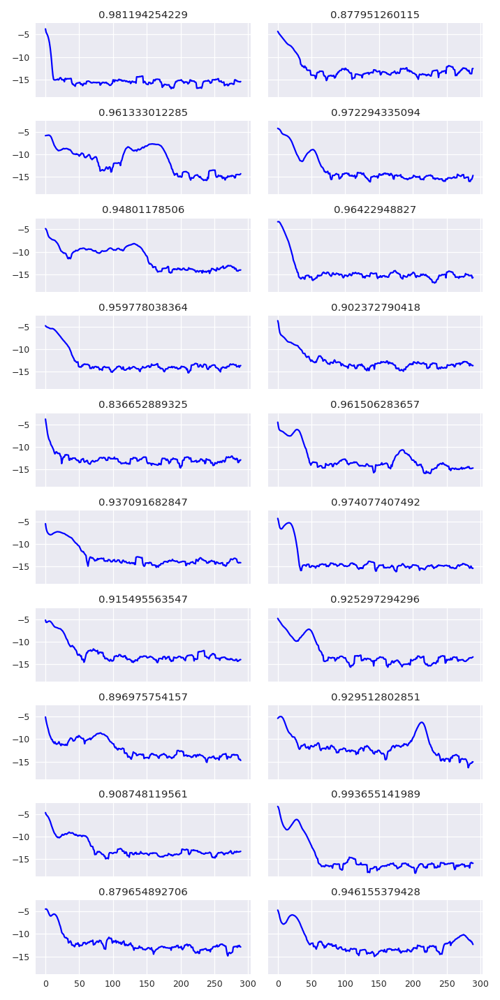

100% (20 of 20) |########################| Elapsed Time: 0:00:04 Time:  0:00:04


In [442]:
plot_history_variance_grid(glob.glob('../data/qft_training_ancillae0_initvaluesRandom_adadelta/*.pickle'),
                           10, 2, figsize=(8, 16), show_parameters=False, log_plot=True)

<IPython.core.display.Javascript object>


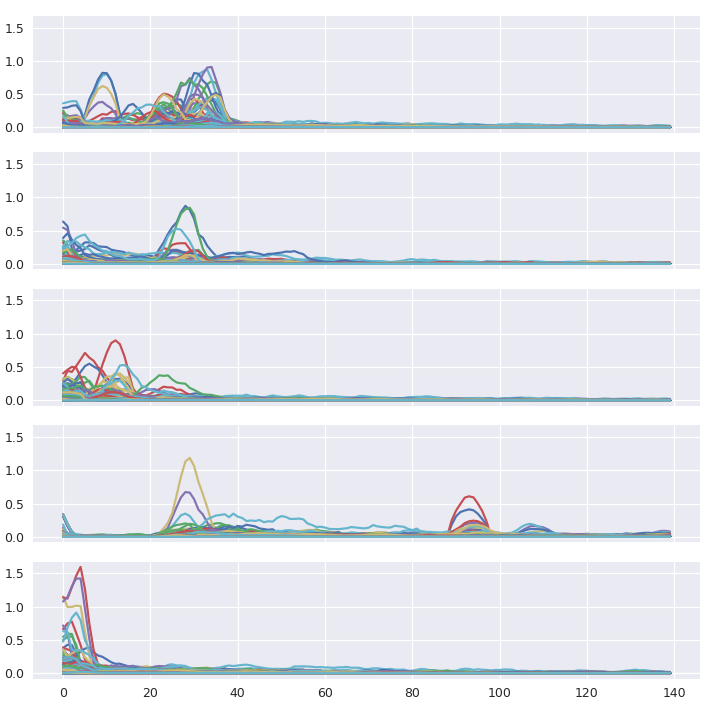

100% (5 of 5) |##########################| Elapsed Time: 0:00:09 Time:  0:00:09


In [398]:
plot_history_variance_grid(glob.glob('../data/qft_training_ancillae5_initvalues8/*.pickle'), 4, 1)

## Directly look at how parameters evolve during training

All the histories seem to be the same when using `initial_parameters=1` and `adadelta` SGD.
This can be checked looking at all the training files in `../data/qft_training_ancillae1_initvalues1_adadelta/`:

In [61]:
Optimizer.load('../data/qft_training_ancillae1_initvalues1_adadelta/training_no_1.pickle').plot_parameters_history()

Consistently with the above, all of the final parameters are basically the same:

In [82]:
NetsDataFolder(glob.glob('../data/qft_training_ancillae1_initvalues1_adadelta*/*.pickle')).plot_parameters()

This is *not* the case when using regular momentum SGD, as immediately seen looking at the training histories in `'../data/qft_training_ancillae1_initvalues1/`:

In [75]:
Optimizer.load('../data/qft_training_ancillae1_initvalues1/training_no_1.pickle').plot_parameters_history()

## Study of final parameters achieved through training

### Best results with no ancillae:

In [4]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 0]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()

### Best results with one ancilla:

In [168]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 1]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()

### Best results with 2 ancilla:

In [173]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 2]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()

### Best results with 3 ancillae:

In [170]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 3]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()

### Best results with 4 ancillae:

In [171]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 4]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()

### Best results with 5 ancillae:

In [7]:
summary_path = '../../data/nets/QFT/fidelities_summary.json'
all_fidelities = pd.read_json(summary_path)
all_fidelities = all_fidelities.loc[all_fidelities['num ancillae'] == 5]
good_nets = all_fidelities.sort_values(by='fidelity').reset_index(drop=True)[-5:]['paths'].tolist()
NetsDataFolder(good_nets).plot_parameters()